## Knowledge Graph

Authors: Jose Rodrigo Flores Espinosa & Marta Napa (Group 6)

To run GraphFrames it is necessary to install graphframes jar package.
1. Open https://spark-packages.org/package/graphframes/graphframes
2. Pick a release version that matches the cluster's Spark and Scala versions (to see cluster's information, open cluster - Configuration - Databricks Runtime Version).
3. Download the jar file.
4. From the left menu open Workspace - Shared - Create a folder - Create a library - Drop jar file.
4. Install jar file on the cluster (Open cluster - Libraries - From Workspace - Select the library you just created).

### Preprocessing
The goal is to prepare data for:
- Construction of a knowledge graph for the publications data set
- Running queries aginst the graph using Spark Graph Frames
- Graph analytics on the constructed knowledge graph

Preprocessing is done together with the next tasks.

### Entitites/Vertices
- Authors - ("authors")
- Institutions - ("organization")
- Scientific domains - ("fos_specific")
- Publishing venues - ("venue")
- Publication - ("id")

In [0]:
# All partitions
path = ["/FileStore/tables/dblpv13_edited_parsed_part_1_json.gz", 
       "/FileStore/tables/dblpv13_edited_parsed_part_2_json.gz"] #... other 15 files

In [0]:
# Loading the data (creating the main dataframe), selecting only columns that we need
df = spark.read.json(path).select("authors", "organization", "fos_specific", "id", "n_citation", "references", "venue")
# dropping NA values, as they do not provide information
df = df.replace('NA', None).dropna(how='any')
display(df)

authors,organization,fos_specific,id,n_citation,references,venue
Seungjin Park;Brian VanVoorst,NA;NA,computer sciences,53e99a85b7602d97022fb093,5,"List(53e9bcc5b7602d970494b36e, 53e9be80b7602d9704b465b2, 53e9a603b7602d9702f2ef7f, 53e9b030b7602d9703a8fae9, 53e9aa48b7602d97033b7da1, 53e9af6eb7602d97039b23d1, 53e9b281b7602d9703d25b48, 53e9b403b7602d9703ef686a)","List(5550372a7cea80f954177a10, International Conference on Parallel Processing, ICPP, 0)"
Zicheng Liao;Hugues Hoppe;David Forsyth;Yizhou Yu,"University of Illinois at Urbana-Champaign, Champaign;Microsoft Research, Redmond;University of Illinois at Urbana-Champaign, Champaign;University of Illinois at Urbana-Champaign, Champaign",computer sciences,53e99a85b7602d97022fb0ab,43,"List(53e9a415b7602d9702d2dc60, 558aaa27e4b031bae1f8f25a, 53e9b444b7602d9703f41800, 53e9a472b7602d9702d8d285, 53e99b30b7602d97023cc284, 53e9a82cb7602d9703174deb, 53e9a603b7602d9702f2f0d6, 53e99f35b7602d970280589e, 53e9a620b7602d9702f50e60, 53e9b790b7602d970433671f, 53e9a2b3b7602d9702bbebe7, 53e9b02fb7602d9703a8e493, 53e9984bb7602d970207e263, 53e9bba7b7602d97047f1158, 53e9b2f4b7602d9703db13c7, 53e9b63bb7602d9704199696, 53e9b500b7602d970402ee2e, 53e9b9a0b7602d970458faaa, 53e99931b7602d9702171e93, 53e99c4bb7602d97024faae9, 53e9b2dbb7602d9703d90dc7, 53e9a930b7602d9703280541, 53e99b3cb7602d97023d9dae, 53e9bdd4b7602d9704a8255d, 53e9a38fb7602d9702c9abd3, 53e9addbb7602d97037e6339, 53e9be72b7602d9704b324e1, 53e9aca1b7602d970367af8d)","List(555036c17cea80f9541516a1, NA, IEEE Trans. Vis. Comput. Graph, 0)"
Xianghong Sun;Qingxin Shi,"State Key Laboratory of Brain and Cognitive Science, Inst. of Psychology, Chinese Academy of Science, Beijing, China;State Key Laboratory of Brain and Cognitive Science, Inst. of Psychology, Chinese Academy of Science, Beijing, China and Department of Informatics, Copenhagen Business School, Denmark",psychology,53e99a85b7602d97022fb2c1,7,"List(53e9b4e4b7602d97040099b8, 53e9ac0bb7602d97035ca241, 53e99ad7b7602d970235be7b, 53e9b9fbb7602d97045f70c1, 573695426e3b12023e47068d, 53e9a53fb7602d9702e60d12)","List(53a7261620f7420be8b66695, International Conference on Human-Computer Interaction, HCI, 0)"
András Czövek;Gergely J Szöllosi;Imre Derényi,"Department of Biological Physics, Eötvös University, Pázmány P. stny. 1A, H-1117 Budapest, Hungary;Department of Biological Physics, Eötvös University, Pázmány P. stny. 1A, H-1117 Budapest, Hungary;NA",biology science,53e99a85b7602d97022fb217,7,List(NA),"List(NA, NA, Biosystems, NA)"
C. Heitzinger;W. Pyka;N. Tamaoki;T. Takase;T. Ohmine;S. Selberherr,"Inst. for Microelectron., Tech. Univ. of Vienna, Austria;NA;NA;NA;NA;NA","electrical, electronic and information engineering",53e99a85b7602d97022fb30c,5,"List(53e9a691b7602d9702fc5e75, 53e99a26b7602d970227fdf6)","List(5390a73620f70186a0e8b3be, NA, IEEE Transactions on Computer-Aided Design of Integrated Circuits and Systems, NA)"
Mark Debbage;Mark B. Hill;Denis A. Nicole,"Univ. of Southampton, Southampton, UK;INMOS Ltd., Bristol, UK;INMOS Ltd., Bristol, UK",computer sciences,53e99a85b7602d97022fb3ad,3,"List(53e9bc1bb7602d9704881c79, 558ad2e884ae84d265bfd99b, 558ab7cd84ae84d265bf3ce4, 53e9aaf4b7602d9703478baa, 53e99827b7602d9702047df3, 573696636e3b12023e570862, 53e99ddab7602d970269ba4b, 557cd46ff667eeed56193483, 55827efb0cf2bf7bae57aa4e)","List(555036e37cea80f954163f30, IEEE Transactions on Parallel and Distributed Systems, IEEE Trans. Parallel Distrib. Syst, 0)"
Hisashi Ikeda;Naohiro Furukawa;Katsumi Marukawa;Hiromichi Fujisawa,"Central Research Laboratory, Hitachi, Ltd., 1-280 Higashi-Koigakubo Kokubunji, Tokyo, 185-8601 Japan;Central Research Laboratory, Hitachi, Ltd., 1-280 Higashi-Koigakubo Kokubunji, Tokyo, 185-8601 Japan;Central Research Laboratory, Hitachi, Ltd., 1-280 Higashi-Koigakubo Kokubunji, Tokyo, 185-8601 Japan;Central Research Laboratory, Hitachi, Ltd., 1-280 Higashi-Koigakubo Kokubunji, Tokyo, 185-8601 Japan",information sciences,53e99a85b7602d97022fb263,1,"List(53e9a5beb7602d9702ee818e

#### Create IDs for scientific domains
1. Create a separate table that holds the distinct values of scientific domains
2. Generate an ID for each domain (should be unique)
3. Add generated IDs to the main dataframe

In [0]:
import pyspark.sql.functions as f
# introduce an ID to the specialization

# a list of distinct fos_specific values
df_specializations = df.select('fos_specific').distinct().collect() 
# converting to dataframe
df_specializations = spark.createDataFrame(df_specializations) 
# add ID number column
df_specializations = df_specializations.rdd.zipWithIndex().toDF() # to create an ID
df_specializations = df_specializations.select(("_1.*"), ("_2"))
# add specialization specific letter to the ID
df_specializations = df_specializations.withColumn("fos_specific_id", f.format_string("S%d", "_2"))
# drop column _2, as we don't need it anymore
df_specializations = df_specializations.drop("_2")
#df_specializations
display(df_specializations)

fos_specific,fos_specific_id
bioengineering and biomedical engineering,S0
chemical engineering,S1
chemical sciences,S2
materials engineering,S3
"philosophy, ethics and religion",S4
computer sciences,S5
"economics, finance and business",S6
psychology,S7
agricultural biotechnology,S8
history and archaeology,S9


In [0]:
# add generated ID to the initial table (join initial df with df_specializations)
df = df.join(df_specializations, df.fos_specific == df_specializations.fos_specific).select(df['*'],df_specializations['fos_specific_id'])
display(df)

authors,organization,fos_specific,id,n_citation,references,venue,fos_specific_id
Nadège Varsier;Kanako Wake;Masao Taki;Soichi Watanabe,NA;NA;NA;NA,bioengineering and biomedical engineering,53e99a8bb7602d97022fdbb3,3,List(NA),"List(555036cc7cea80f95415814b, IEICE Transactions on Communications, IEICE Transactions, 0)",S0
G Sebastiani;F Godtliebsen;R A Jones;O Haraldseth;T B Muller;P A Rinck,"Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway;Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway;NA;NA;NA;NA",bioengineering and biomedical engineering,53e99a8bb7602d97022fdc04,15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)",S0
Didier Staudenmann;Idsart Kingma;Andreas Daffertshofer;Dick F Stegeman;Jaap H van Dieën,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands;Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands;Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands;NA;NA",bioengineering and biomedical engineering,53e99aa6b7602d970231f347,118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",S0
Hervé Lombaert;Jean-Marc Peyrat;Laurent Fanton;Farida Cheriet;Hervé Delingette;Nicholas Ayache;Patrick Clarysse;Isabelle Magnin;Pierre Croisille,"INRIA, Asclepios Team, Sophia-Antipolis, France;Siemens Molecular, Oxford, UK;CREATIS, Université de Lyon, France;École Polytechnique de Montréal, Canada;INRIA, Asclepios Team, Sophia-Antipolis, France;INRIA, Asclepios Team, Sophia-Antipolis, France;CREATIS, Université de Lyon, France;CREATIS, Université de Lyon, France;CREATIS, Université de Lyon, France",bioengineering and biomedical engineering,53e99aa6b7602d97023210c5,7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",S0
Francesco Conversano;Antonio Greco;Ernesto Casciaro;Andrea Ragusa;Aimé Lay-Ekuakille;Sergio Casciaro,"Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy;Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy;Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy;National Nanotechnology Laboratory of CNR-NANO, Lecce, Italy;Department of Innovation Engineering, University of Salento, Lecce, Italy;Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy",bioengineering and biomedical engineering,53e99aacb7602d9702326ab5,24,"List(53e9b9a6b7602d97045981ef, 53e9ba00b7602d97045fe09d, 558ac4c7e4b037c087590af1, 558aa71de4b031bae1f8e23c, 558c8d8ee4b00c3c48e2f027, 53e9a877b7602d97031c5195, 53e9a11bb7602d9702a0cc17, 53e99ceeb7602d97025a6440, 53e9b010b7602d9703a6c4ef, 53e99984b7602d97021c711a, 558a3398e4b037c08755bdda)","List(NA, NA, IEEE Transactions on Instrumentation and Measurement, NA)",S0
Thorsten Vollborn;Daniel Habor;Simon Junk;Klaus Radermacher;Stefan Heger,rwth aachen university;rwth aachen university;rwth aachen university;rwth aachen university;rwth aachen university,bioengineering and biomedical engineering,53e99aacb7602d9702328453,7,List(NA),"List(555037837cea80f95418b43e, Intelligent Robots and Systems, IROS, 0)",S0
Andreas Kuhn;Thierry Keller;Marc Lawrence;Manfred Morari,ETH Zurich Automatic Control Laboratory Physikstrasse 3 8092 Zurich Switzerland;ETH Zurich Automatic Control Laboratory Physikstrasse 3 8092 Zurich Switzerland;ETH Zurich Automatic Control Laboratory Physikstrasse 3 8092 Zurich Switzerland;ETH Zurich Automatic Control Laboratory Physikstrasse 3 8092 Zurich Switzerland,bioengineering and

#### Create IDs for authors
1. Explode the data in the main dataframe (as some cells currently contain multiple authors/organizations)
2. Generate a unique ID for each author
3. Generate a unique ID for each organization
4. Add generated IDs to the main table

In [0]:
# convert ; separated strings into arrays and then explode them into multiple rows
# https://www.geeksforgeeks.org/convert-comma-separated-string-to-array-in-pyspark-dataframe/

from pyspark.sql.functions import split, col

data2 = df

data2 = data2.select(split(col("authors"),";").alias('authors'), col('fos_specific'), col('id'), col('fos_specific_id'), col('organization'), col('n_citation'), col("references"), col("venue"))
data2 = data2.select(split(col('organization'),';').alias('organization'), col('fos_specific'), col('id'), col('fos_specific_id'), col('authors'), col('n_citation'), col("references"), col("venue"))

display(data2)

organization,fos_specific,id,fos_specific_id,authors,n_citation,references,venue
"List(NA, NA, NA, NA)",bioengineering and biomedical engineering,53e99a8bb7602d97022fdbb3,S0,"List(Nadège Varsier, Kanako Wake, Masao Taki, Soichi Watanabe)",3,List(NA),"List(555036cc7cea80f95415814b, IEICE Transactions on Communications, IEICE Transactions, 0)"
"List(Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway, Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway, NA, NA, NA, NA)",bioengineering and biomedical engineering,53e99a8bb7602d97022fdc04,S0,"List(G Sebastiani, F Godtliebsen, R A Jones, O Haraldseth, T B Muller, P A Rinck)",15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)"
"List(Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands, Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands, Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands, NA, NA)",bioengineering and biomedical engineering,53e99aa6b7602d970231f347,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)"
"List(INRIA, Asclepios Team, Sophia-Antipolis, France, Siemens Molecular, Oxford, UK, CREATIS, Université de Lyon, France, École Polytechnique de Montréal, Canada, INRIA, Asclepios Team, Sophia-Antipolis, France, INRIA, Asclepios Team, Sophia-Antipolis, France, CREATIS, Université de Lyon, France, CREATIS, Université de Lyon, France, CREATIS, Université de Lyon, France)",bioengineering and biomedical engineering,53e99aa6b7602d97023210c5,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)"
"List(Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy, Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy, Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy, National Nanotechnology Laboratory of CNR-NANO, Lecce, Italy, Department of Innovation Engineering, University of Salento, Lecce, Italy, Bioengineering Division, National Research Council, Institute of Clinical Physiology , Lecce, Italy)",bioengineering and biomedical engineering,53e99aacb7602d9702326ab5,S0,"List(Francesco Conversano, Antonio Greco, Ernesto Casciaro, Andrea Ragusa, Aimé Lay-Ekuakille, Sergio Casciaro)",24,"List(53e9b9a6b7602d97045981ef, 53e9ba00b7602d97045fe09d, 558ac4c7e4b037c087590af1, 558aa71de4b031bae1f8e23c, 558c8d8ee4b00c3c48e2f027, 53e9a877b7602d97031c5195, 53e9a11bb7602d9702a0cc17, 53e99ceeb7602d97025a6440, 53e9b010b7602d9703a6c4ef, 53e99984b7602d97021c711a, 558a3398e4b037c08755bdda)","List(NA, NA, IEEE Transactions on Instrumentation and Measurement, NA)"
"List(rwth aachen university, rwth aachen university, rwth aachen university, rwth aachen university, rwth aachen university)",bioengineering and biomedical engineering,53e99aacb7602d9702328453,S0,"List(Thorsten Vollborn, Daniel Habor, Simon Junk, Klaus Radermacher, Stefan Heger)",7,List(NA),"List(555037837cea80f95418b43e, Intelligent Robots and Systems, IROS, 0)"
"List(ETH Zurich Automatic Control Laboratory Physikstrasse 3 8092 Zurich Switzerland, ETH Zurich Automatic Control Laboratory Physikstrasse 3 8092 Zurich Switzerland, ETH Zurich Automatic Control Laboratory Physikstrasse 3 8092 Zurich Switzerland, 

In [0]:
# explode 'authors' and 'organization' arrays into rows
df = data2.withColumn("new", f.arrays_zip("authors", "organization"))\
       .withColumn("new", f.explode("new"))\
       .select("id", "fos_specific", "fos_specific_id", "authors", "n_citation", "references", "venue", f.col("new.authors").alias("author"), f.col("new.organization").alias("organization"))
# as many new NAs 'created', we will drop those
df = df.replace('NA', None).dropna(how='any')

display(df)

id,fos_specific,fos_specific_id,authors,n_citation,references,venue,author,organization
53e99a8bb7602d97022fdc04,bioengineering and biomedical engineering,S0,"List(G Sebastiani, F Godtliebsen, R A Jones, O Haraldseth, T B Muller, P A Rinck)",15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)",G Sebastiani,"Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway"
53e99a8bb7602d97022fdc04,bioengineering and biomedical engineering,S0,"List(G Sebastiani, F Godtliebsen, R A Jones, O Haraldseth, T B Muller, P A Rinck)",15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)",F Godtliebsen,"Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway"
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Didier Staudenmann,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands"
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Idsart Kingma,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands"
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Andreas Daffertshofer,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands"
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France"
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK"
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France"
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isa

In [0]:
# create IDs for each author

# a list of distinct authors
df_authors = df.select('author').distinct().collect() 
# converting to dataframe
df_authors = spark.createDataFrame(df_authors) 
# add ID number column
df_authors = df_authors.rdd.zipWithIndex().toDF() # to create an ID
df_authors = df_authors.select(("_1.*"), ("_2"))
# add A letter to the ID (to create a unique ID)
df_authors = df_authors.withColumn("author_id", f.format_string("A%d", "_2"))
# drop column _2, as we don't need it anymore
df_authors = df_authors.drop("_2")
#df_authors
display(df_authors)

author,author_id
Ernesto Casciaro,A0
A. J. de Crespigny,A1
Tanja Lukovic,A2
Xue Wang,A3
Ute Morgenstern,A4
Simon R. Arridge,A5
L. Michalas,A6
Ramaswamy Bhuvaneswari,A7
Charles Acquah,A8
Giovanni Grazioso,A9


In [0]:
# add generated ID to the initial table (join initial df with df_authors)
df = df.join(df_authors, df.author == df_authors.author).select(df['*'],df_authors['author_id'])
display(df)

id,fos_specific,fos_specific_id,authors,n_citation,references,venue,author,organization,author_id
53e99a8bb7602d97022fdc04,bioengineering and biomedical engineering,S0,"List(G Sebastiani, F Godtliebsen, R A Jones, O Haraldseth, T B Muller, P A Rinck)",15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)",G Sebastiani,"Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway",A103429
53e99a8bb7602d97022fdc04,bioengineering and biomedical engineering,S0,"List(G Sebastiani, F Godtliebsen, R A Jones, O Haraldseth, T B Muller, P A Rinck)",15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)",F Godtliebsen,"Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway",A47304
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Didier Staudenmann,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands",A133284
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Idsart Kingma,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands",A67223
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Andreas Daffertshofer,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands",A49250
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",A52319
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",A154891
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",A156901
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Fa

#### Create IDs for organizations

In [0]:
# create IDs for each organization

# a list of distinct organizations
df_organizations = df.select('organization').distinct().collect() 
# converting to dataframe
df_organizations = spark.createDataFrame(df_organizations) 
# add ID number column
df_organizations = df_organizations.rdd.zipWithIndex().toDF() # to create an ID
df_organizations = df_organizations.select(("_1.*"), ("_2"))
# add O letter to the ID (to create a unique ID)
df_organizations = df_organizations.withColumn("organization_id", f.format_string("O%d", "_2"))
# drop column _2, as we don't need it anymore
df_organizations = df_organizations.drop("_2")
#df_organizations
display(df_organizations)

organization,organization_id
"Clemson Univ, Dept Mech Engn, Clemson, SC 29634 USA",O0
"Department of Computer Science, Yale University, P O Box 2158, Yale Station, New Haven, CT",O1
"(Correspd.) 801, 22nd ST NW, Suite 703, Washington, DC 20052, USA",O2
"France Telecom, 2 Avenue Pierre Marzin, 22307 Lannion cedex, France",O3
"National Taiwan University, Taipei, Taiwan",O4
"LORIA & INRIA Lorraine, Villers-lèès-Nancy Cedex, France",O5
Jagiellonian University Institute of Computer Science Cracow Poland,O6
"TeliaSonera Finland, P.O.Box 970, Teollisuuskatu 13, FIN-00051 SONERA",O7
"Computer Science Department, Rowan University, 201 Mullica Hill Road, Glassboro, NJ 08028, USA",O8
"Sant Longowal Institute of Engineering and Technology, Longowal, Punjab, India",O9


In [0]:
# add generated ID to the initial table (join initial df with df_organization)
df = df.join(df_organizations, df.organization == df_organizations.organization).select(df['*'],df_organizations['organization_id'])
display(df)

id,fos_specific,fos_specific_id,authors,n_citation,references,venue,author,organization,author_id,organization_id
53e99a8bb7602d97022fdc04,bioengineering and biomedical engineering,S0,"List(G Sebastiani, F Godtliebsen, R A Jones, O Haraldseth, T B Muller, P A Rinck)",15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)",G Sebastiani,"Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway",A103429,O111101
53e99a8bb7602d97022fdc04,bioengineering and biomedical engineering,S0,"List(G Sebastiani, F Godtliebsen, R A Jones, O Haraldseth, T B Muller, P A Rinck)",15,"List(53e99b1bb7602d97023b33da, 53e99f27b7602d97027f3bd2, 53e9ba76b7602d970469a48a)","List(NA, NA, IEEE Transactions on Medical Imaging, NA)",F Godtliebsen,"Dept. of Math. Sci., Norwegian Inst. of Technol., Trondheim, Norway",A47304,O111101
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Didier Staudenmann,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands",A133284,O73374
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Idsart Kingma,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands",A67223,O73374
53e99aa6b7602d970231f347,bioengineering and biomedical engineering,S0,"List(Didier Staudenmann, Idsart Kingma, Andreas Daffertshofer, Dick F Stegeman, Jaap H van Dieën)",118,List(558a2dfce4b0b32fcb3549ad),"List(NA, NA, IEEE Transactions on Biomedical Engineering, NA)",Andreas Daffertshofer,"Inst. for Fundamental & Clinical Human Movement Sci., Vrije Univ., Amsterdam, Netherlands",A49250,O73374
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",A52319,O73375
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",A154891,O70408
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",A156901,O39200
53e99aa6b7602d97023210c5,bioengineering and biomedical

#### Create IDs for publishing venues
Fortunately, we do not have to create IDs for publishing venues, as each publishing venue already has a unique ID.

In [0]:
# a list of distinct venues
df_venues = df.select('venue.*').distinct().collect() 
# converting to dataframe
df_venues = spark.createDataFrame(df_venues) 
df_venues = df_venues.select(col("id").alias("venue_id"))
#df_venues
display(df_venues)

venue_id
NA
NA
53a72ce420f7420be8c5256b
5390b44b20f70186a0efa5ba
53a72dbb20f7420be8c720e3
53e1832920f7dfbc07e8c538
53a7281920f7420be8ba8f14
53a726f520f7420be8b87a81
53a726b620f7420be8b7ec78
53a72e6820f7420be8c8bdeb


In [0]:
# add generated ID to the initial table (join initial df with df_organization)
df = df.join(df_venues, df.venue.id == df_venues.venue_id)
# as some venues had empty IDs, we drop NA values again
df = df.replace('NA', None).dropna(how='any')
display(df)

id,fos_specific,fos_specific_id,authors,n_citation,references,venue,author,organization,author_id,organization_id,venue_id
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",A52319,O73375,5550378e7cea80f95418f170
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",A52319,O73375,5550378e7cea80f95418f170
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",A154891,O70408,5550378e7cea80f95418f170
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",A154891,O70408,5550378e7cea80f95418f170
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",A156901,O39200,5550378e7cea80f95418f170
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",A156901,O39200,5550378e7cea80f95418f170
53e99aa6b7602d970

#### Add created IDs to the Vertices dataframe 
Only IDs should be added

In [0]:
# Creating a df for vertices
df_vertices = (df
               .select(f.col('fos_specific_id').alias('id')) # add scientific domain IDs
               .union(df
                      .select(f.col('id'))) # add publication IDs
               .union(df
                     .select(f.col('author_id').alias('id'))) # add author IDs
               .union(df
                     .select(f.col('organization_id').alias('id'))) # add organization IDs
               .union(df
                      .select(f.col('venue_id').alias('id'))) # add venue IDs
               .distinct()
)

display(df_vertices)

id
S6
S4
S3
S0
S5
S2
S1
S27
S8
S32


### Relationships/Edges
- Authorship (author, publication)
- co-authorship (author, author)
- works for (author, institution)
- specializations (author, scientific domain)
- cites (publication, publication)

#### Authorship edges

In [0]:
authorship_edges = (df
                    .select(f.col('author_id').alias('src')
                          ,f.col('id').alias('dst')
                          ,f.col('*'))
                    .drop('author_id', 'id')
)
display(authorship_edges)

src,dst,fos_specific,fos_specific_id,authors,n_citation,references,venue,author,organization,organization_id,venue_id
A52319,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",O73375,5550378e7cea80f95418f170
A52319,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",O73375,5550378e7cea80f95418f170
A154891,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",O70408,5550378e7cea80f95418f170
A154891,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",O70408,5550378e7cea80f95418f170
A156901,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",O39200,5550378e7cea80f95418f170
A156901,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",O39200,5550378e7cea80f95418f170
A106373,53e99aa6b7602d

In [0]:
import graphframes as gf
authorship_graph = gf.GraphFrame(df_vertices, authorship_edges)
display(authorship_graph)

GraphFrame(v:[id: string], e:[src: string, dst: string ... 10 more fields])

In [0]:
display(authorship_graph.triplets)

src,edge,dst
List(A44856),"List(A44856, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, S0, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, O24509, 53a727af20f7420be8b97f2d)",List(53e99b9bb7602d9702444e84)
List(A44856),"List(A44856, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, S0, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, O24509, 53a727af20f7420be8b97f2d)",List(53e99b9bb7602d9702444e84)
List(A44856),"List(A44856, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, S0, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, O24509, 53a727af20f7420be8b97f2d)",List(53e99b9bb7602d9702444e84)
List(A137864),"List(A137864, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(53e99c66b7602d9702515cec)
List(A137864),"List(A137864, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(53e99c66b7602d9702515cec)
List(A137864),"List(A137864, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(53e99c66b7602d9702515cec)
List(A137864),"List(A137864, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(53e99c91b7602d9702544686)
List(A137864),"List(A137864, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(53e99c91b7602d9702544686)
List(A137864),"List(A137864, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(53e99c91b7602d9702544686)
List(A89851),"List(A89851, 53e999f5b7602d970223cc05, bioengineering and biomedical engineering, S0, List(Wei Dai, Mona A Sheikh, Olgica Milenkovic, Richard G Baraniuk), 87, List(55a4db0f612c6b12aafbd782, 53e9ba84b760

#### Co-authorship edges
(author, author)

In [0]:
# prepare df
# explode authors column
co_authorship_df = df.withColumn("new", f.arrays_zip("authors"))\
       .withColumn("new", f.explode("new"))\
       .select("id", "fos_specific", "fos_specific_id", "author", f.col("author_id").alias("author1_id"),f.col("new.authors").alias("author2"))

display(co_authorship_df)

id,fos_specific,fos_specific_id,author,author1_id,author2
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Hervé Lombaert
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Jean-Marc Peyrat
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Laurent Fanton
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Farida Cheriet
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Hervé Delingette
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Nicholas Ayache
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Patrick Clarysse
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Isabelle Magnin
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Pierre Croisille
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Hervé Lombaert


In [0]:
# add id's to authors column
co_authorship_df = co_authorship_df.join(df_authors, co_authorship_df.author2 == df_authors.author).select(co_authorship_df['*'],df_authors['author_id'].alias("author2_id"))
display(co_authorship_df)


id,fos_specific,fos_specific_id,author,author1_id,author2,author2_id
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Hervé Lombaert,A52319
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Jean-Marc Peyrat,A154891
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Laurent Fanton,A156901
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Farida Cheriet,A106373
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Hervé Delingette,A6605
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Nicholas Ayache,A154892
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Patrick Clarysse,A3609
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Isabelle Magnin,A146827
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Pierre Croisille,A52836
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Hervé Lombaert,A52319


In [0]:
# remove rows where author_1 == author_2
co_authorship_df = co_authorship_df.where(col('author1_id')!=col('author2_id'))
display(co_authorship_df)

id,fos_specific,fos_specific_id,author,author1_id,author2,author2_id
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Jean-Marc Peyrat,A154891
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Laurent Fanton,A156901
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Farida Cheriet,A106373
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Hervé Delingette,A6605
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Nicholas Ayache,A154892
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Patrick Clarysse,A3609
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Isabelle Magnin,A146827
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Pierre Croisille,A52836
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Jean-Marc Peyrat,A154891
53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,A52319,Laurent Fanton,A156901


In [0]:
co_authorship_edges = (co_authorship_df
                    .select(f.col('author1_id').alias('src')
                          ,f.col('author2_id').alias('dst')
                          ,f.col('*'))
                    .drop('author1_id', 'author2_id')
)
display(co_authorship_edges)

src,dst,id,fos_specific,fos_specific_id,author,author2
A52319,A154891,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Jean-Marc Peyrat
A52319,A156901,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Laurent Fanton
A52319,A106373,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Farida Cheriet
A52319,A6605,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Hervé Delingette
A52319,A154892,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Nicholas Ayache
A52319,A3609,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Patrick Clarysse
A52319,A146827,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Isabelle Magnin
A52319,A52836,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Pierre Croisille
A52319,A154891,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Jean-Marc Peyrat
A52319,A156901,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,Hervé Lombaert,Laurent Fanton


In [0]:
co_authorship_graph = gf.GraphFrame(df_vertices, co_authorship_edges)
display(co_authorship_graph)

GraphFrame(v:[id: string], e:[src: string, dst: string ... 5 more fields])

#### Works for edges 
(author, organization)

In [0]:
works_for_edges = (df
                    .select(f.col('author_id').alias('src')
                          ,f.col('organization_id').alias('dst')
                          ,f.col('*'))
                    .drop('author_id', 'organization_id')
)
display(works_for_edges)

src,dst,id,fos_specific,fos_specific_id,authors,n_citation,references,venue,author,organization,venue_id
A52319,O73375,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",5550378e7cea80f95418f170
A52319,O73375,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",5550378e7cea80f95418f170
A154891,O70408,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",5550378e7cea80f95418f170
A154891,O70408,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",5550378e7cea80f95418f170
A156901,O39200,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",5550378e7cea80f95418f170
A156901,O39200,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,S0,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",5550378e7cea80f95418f170
A106373,O633,53e99aa6b7602d97023210

In [0]:
works_for_graph = gf.GraphFrame(df_vertices, works_for_edges)
display(works_for_graph)

GraphFrame(v:[id: string], e:[src: string, dst: string ... 10 more fields])

In [0]:
display(works_for_graph.triplets)

src,edge,dst
List(A44856),"List(A44856, O24509, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, S0, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, 53a727af20f7420be8b97f2d)",List(O24509)
List(A44856),"List(A44856, O24509, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, S0, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, 53a727af20f7420be8b97f2d)",List(O24509)
List(A44856),"List(A44856, O24509, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, S0, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, 53a727af20f7420be8b97f2d)",List(O24509)
List(A137864),"List(A137864, O34684, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, 555037347cea80f95417a095)",List(O34684)
List(A137864),"List(A137864, O34684, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, 555037347cea80f95417a095)",List(O34684)
List(A137864),"List(A137864, O34684, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, 555037347cea80f95417a095)",List(O34684)
List(A137864),"List(A137864, O34684, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, 555037347cea80f95417a095)",List(O34684)
List(A137864),"List(A137864, O34684, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, 555037347cea80f95417a095)",List(O34684)
List(A137864),"List(A137864, O34684, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, S0, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, 555037347cea80f95417a095)",List(O34684)
List(A89851),"List(A89851, O111102, 53e999f5b7602d970223cc05, bioengineering and biomedical engineering, S0, List(Wei Dai, Mona A Sheikh, Olgica Milenkovic, Richard G Baraniuk), 87, List(55a4db0f612c6b12aafbd782, 53e9ba84b7602d97046a80c6, 53e99a04b7602d970224eda6, 53e99ec4b7602d970278f4bd, 53e9adf6b7602d97038018ad, 53e9b850b7602d97044134fa, 53e9ba16b7602d970461a06f, 53e99884b

#### Specializations edges
(author, scientific domain)

In [0]:
specialization_edges = (df
                    .select(f.col('author_id').alias('src')
                          ,f.col('fos_specific_id').alias('dst')
                          ,f.col('*'))
                    .drop('author_id', 'fos_specific_id')
)
display(specialization_edges)

src,dst,id,fos_specific,authors,n_citation,references,venue,author,organization,organization_id,venue_id
A52319,S0,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",O73375,5550378e7cea80f95418f170
A52319,S0,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Hervé Lombaert,"INRIA, Asclepios Team, Sophia-Antipolis, France",O73375,5550378e7cea80f95418f170
A154891,S0,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",O70408,5550378e7cea80f95418f170
A154891,S0,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Jean-Marc Peyrat,"Siemens Molecular, Oxford, UK",O70408,5550378e7cea80f95418f170
A156901,S0,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",O39200,5550378e7cea80f95418f170
A156901,S0,53e99aa6b7602d97023210c5,bioengineering and biomedical engineering,"List(Hervé Lombaert, Jean-Marc Peyrat, Laurent Fanton, Farida Cheriet, Hervé Delingette, Nicholas Ayache, Patrick Clarysse, Isabelle Magnin, Pierre Croisille)",7,"List(53e9b7adb7602d970435307a, 53e9a246b7602d9702b49c0e, 5b65e839ab2dfb45920935bd, 53e9aab0b7602d97034289d4, 53e9a122b7602d9702a0f275, 53e9b13eb7602d9703bbe0e4, 53e9bad7b7602d970470427a, 53e9ab00b7602d9703482b4b, 53e9b4d9b7602d9703ffd7a8, 53e9abdfb7602d970359911f)","List(5550378e7cea80f95418f170, NA, STACOM, 0)",Laurent Fanton,"CREATIS, Université de Lyon, France",O39200,5550378e7cea80f95418f170
A106373,S0,53e99aa6b7602d97023210c5

In [0]:
specialization_graph = gf.GraphFrame(df_vertices, specialization_edges)
display(specialization_graph)

GraphFrame(v:[id: string], e:[src: string, dst: string ... 10 more fields])

In [0]:
display(specialization_graph.triplets)

src,edge,dst
List(A44856),"List(A44856, S0, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, O24509, 53a727af20f7420be8b97f2d)",List(S0)
List(A44856),"List(A44856, S0, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, O24509, 53a727af20f7420be8b97f2d)",List(S0)
List(A44856),"List(A44856, S0, 53e99b9bb7602d9702444e84, bioengineering and biomedical engineering, List(Richard A. Robb, Barry K. Gilbert), 3, List(558ab72784ae84d265bf393e), List(53a727af20f7420be8b97f2d, National Computer Conference, AFIPS National Computer Conference, 0), Barry K. Gilbert, Biodynamics Research Unit, Rochester, Minnesota, O24509, 53a727af20f7420be8b97f2d)",List(S0)
List(A137864),"List(A137864, S0, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(S0)
List(A137864),"List(A137864, S0, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(S0)
List(A137864),"List(A137864, S0, 53e99c66b7602d9702515cec, bioengineering and biomedical engineering, List(Taehyong Kim, Murali Ramanathan, Aidong Zhang), 7, List(53e9bbfab7602d97048563ac), List(555037347cea80f95417a095, International Conference on Bioinformatics, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(S0)
List(A137864),"List(A137864, S0, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(S0)
List(A137864),"List(A137864, S0, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(S0)
List(A137864),"List(A137864, S0, 53e99c91b7602d9702544686, bioengineering and biomedical engineering, List(Taehyong Kim, Murali Ramanathan, Lawrence Bone, Aidong Zhang), 2, List(53e99b50b7602d97023f2e12, 53e9b2ffb7602d9703dc08ab, 53e9bb53b7602d970479369d, 53e99c66b7602d9702515cec), List(555037347cea80f95417a095, Scopus, BCB, 0), Taehyong Kim, State University of New York at Buffalo, O34684, 555037347cea80f95417a095)",List(S0)
List(A89851),"List(A89851, S0, 53e999f5b7602d970223cc05, bioengineering and biomedical engineering, List(Wei Dai, Mona A Sheikh, Olgica Milenkovic, Richard G Baraniuk), 87, List(55a4db0f612c6b12aafbd782, 53e9ba84b7602d97046a80c6, 53e99a04b7602d970224eda6, 53e99ec4b7602d970278f4bd, 53e9adf6b7602d97038018ad, 53e9b850b7602d97044134fa, 53e9ba16b7602d970461a06f, 53e99884b7602d97020bbc19, 53e9a4d7b7602d9702df7b5b, 53

#### Cites edges
(Publication, publication)

In [0]:
cites_edges = df.withColumn("new", f.arrays_zip("references"))\
       .withColumn("new", f.explode("new"))\
       .select(f.col("id").alias('src'), f.col("new.references").alias("dst"), f.col("fos_specific"), f.col("author")) 
display(cites_edges)

src,dst,fos_specific,author
53e99aa6b7602d97023210c5,53e9b7adb7602d970435307a,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9a246b7602d9702b49c0e,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,5b65e839ab2dfb45920935bd,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9aab0b7602d97034289d4,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9a122b7602d9702a0f275,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9b13eb7602d9703bbe0e4,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9bad7b7602d970470427a,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9ab00b7602d9703482b4b,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9b4d9b7602d9703ffd7a8,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9abdfb7602d970359911f,bioengineering and biomedical engineering,Hervé Lombaert


In [0]:
cites_graph = gf.GraphFrame(df_vertices, cites_edges)

In [0]:
display(cites_edges.triplets)

src,dst,fos_specific,author
53e99aa6b7602d97023210c5,53e9b7adb7602d970435307a,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9a246b7602d9702b49c0e,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,5b65e839ab2dfb45920935bd,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9aab0b7602d97034289d4,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9a122b7602d9702a0f275,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9b13eb7602d9703bbe0e4,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9bad7b7602d970470427a,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9ab00b7602d9703482b4b,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9b4d9b7602d9703ffd7a8,bioengineering and biomedical engineering,Hervé Lombaert
53e99aa6b7602d97023210c5,53e9abdfb7602d970359911f,bioengineering and biomedical engineering,Hervé Lombaert


### Graph querying
Can use built-in querying features (Motif finding) in GraphFrames (cypher-like) to issue queries like:
- Co-authorship network of a given author (up to n hops)
- publications that are co-authored by authors from different domains
- Visualization of query results

#### Co-authorship network of a given author

In [0]:
df_co_authorship = (co_authorship_graph
                       .find("(a)-[e1]->(b)")
                       .filter(("e1.author == 'Hamid R. Arabnia'"))
                               )

display(df_co_authorship)

a,e1,b
List(A89007),"List(A89007, A92954, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, Himanshu Thapliyal)",List(A92954)
List(A89007),"List(A89007, A18548, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, M. B. Srinivas)",List(A18548)
List(A89007),"List(A89007, A92954, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, Himanshu Thapliyal)",List(A92954)
List(A89007),"List(A89007, A18548, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, M. B. Srinivas)",List(A18548)


In [0]:
# For visualization of query results
!pip install networkx

You should consider upgrading via the '/databricks/python3/bin/python -m pip install --upgrade pip' command.


In [0]:
co_auth_edges = df_co_authorship.select(f.col("e1.src").alias('src')
                          ,f.col("e1.dst").alias('dst')) 
display(co_auth_edges)

src,dst
A89007,A92954
A89007,A18548
A89007,A92954
A89007,A18548


In [0]:
co_auth_nodes = (df_co_authorship
               .select(f.col('a.id').alias('id')) 
               .union(df_co_authorship
                      .select(f.col('b.id').alias('id')))
               .distinct()
)

In [0]:
co_auth_nodes = co_auth_nodes.select('id').rdd.flatMap(lambda x: x).collect()

In [0]:
from pyspark.sql.functions import struct
co_auth_edges = co_auth_edges.withColumn("src_dst", struct(co_auth_edges.src, co_auth_edges.dst))
display(co_auth_edges)

src,dst,src_dst
A89007,A92954,"List(A89007, A92954)"
A89007,A18548,"List(A89007, A18548)"
A89007,A92954,"List(A89007, A92954)"
A89007,A18548,"List(A89007, A18548)"


In [0]:
co_auth_edges = co_auth_edges.select('src_dst').rdd.flatMap(lambda x: x).collect()

In [0]:
import networkx as nx
G = nx.Graph()
G.add_nodes_from(co_auth_nodes)
G.add_edges_from(co_auth_edges)

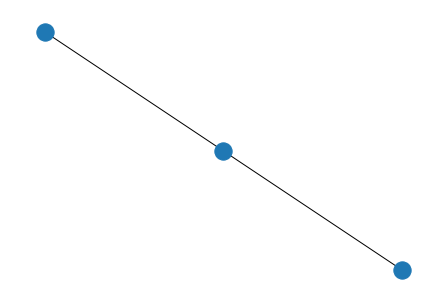

In [0]:
nx.draw(G)

#### Publications that are co-authored by authors from different domains

In [0]:
df_co_authorship_other_domain = (co_authorship_graph
                       .find("(a)-[e1]->(b); (b)-[e2]->(c)")
                       .filter(("e1.author == 'Hamid R. Arabnia'"))
                       .filter(("e1.fos_specific != e2.fos_specific")))
display(df_co_authorship_other_domain)

a,e1,b,e2,c
List(A89007),"List(A89007, A18548, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, M. B. Srinivas)",List(A18548),"List(A18548, A170052, 53e999a5b7602d97021e8125, electrical, electronic and information engineering, S29, M. B. Srinivas, K. S. Sainarayanan)",List(A170052)
List(A89007),"List(A89007, A18548, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, M. B. Srinivas)",List(A18548),"List(A18548, A170196, 53e999a5b7602d97021e8125, electrical, electronic and information engineering, S29, M. B. Srinivas, J. V. R. Ravindra)",List(A170196)
List(A89007),"List(A89007, A18548, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, M. B. Srinivas)",List(A18548),"List(A18548, A170052, 53e999a5b7602d97021e8125, electrical, electronic and information engineering, S29, M. B. Srinivas, K. S. Sainarayanan)",List(A170052)
List(A89007),"List(A89007, A18548, 53e99c0bb7602d97024b7375, computer sciences, S5, Hamid R. Arabnia, M. B. Srinivas)",List(A18548),"List(A18548, A170196, 53e999a5b7602d97021e8125, electrical, electronic and information engineering, S29, M. B. Srinivas, J. V. R. Ravindra)",List(A170196)


In [0]:
df_co_authorship_other_domain_nodes = (df_co_authorship_other_domain
               .select(f.col('a.id').alias('id')) 
               .union(df_co_authorship_other_domain
                      .select(f.col('b.id').alias('id')))
               .distinct()
)

In [0]:
df_co_authorship_other_domain_nodes = df_co_authorship_other_domain_nodes.select('id').rdd.flatMap(lambda x: x).collect()

In [0]:
df_co_authorship_other_domain_edges = df_co_authorship_other_domain.select(f.col("e1.src").alias('src')
                          ,f.col("e1.dst").alias('dst'))

In [0]:
df_co_authorship_other_domain_edges = df_co_authorship_other_domain_edges.withColumn("src_dst", struct(df_co_authorship_other_domain_edges.src, df_co_authorship_other_domain_edges.dst))
display(df_co_authorship_other_domain_edges)

src,dst,src_dst
A89007,A18548,"List(A89007, A18548)"
A89007,A18548,"List(A89007, A18548)"
A89007,A18548,"List(A89007, A18548)"
A89007,A18548,"List(A89007, A18548)"


In [0]:
df_co_authorship_other_domain_edges = df_co_authorship_other_domain_edges.select('src_dst').rdd.flatMap(lambda x: x).collect()

In [0]:
import networkx as nx
G2 = nx.Graph()
G2.add_nodes_from(df_co_authorship_other_domain_nodes)
G2.add_edges_from(df_co_authorship_other_domain_edges)

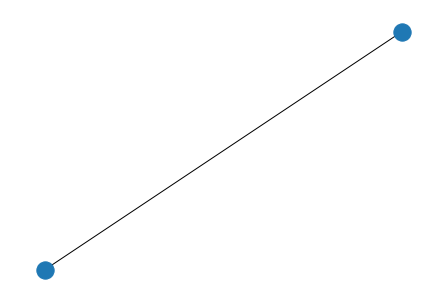

In [0]:
nx.draw(G2)

### Graph analytics
- Influential papers: Page rank
- Communities: find strongly connected components in relationships like co-authorship or being member of the same scientific domain

#### Page rank

In [0]:
# filtering the dataset so job would finish quicker
cites_edges_filtered = cites_edges.filter(cites_edges.author == "Steven Niederer")
df_vertices_cites = (cites_edges_filtered
               .select(f.col('src').alias('id'))
               .union(cites_edges_filtered
                      .select(f.col('dst').alias('id')))
               .distinct()
)
cites_graph_filtered = gf.GraphFrame(df_vertices_cites, cites_edges_filtered)
display(cites_graph_filtered.triplets)

src,edge,dst
List(53e99afdb7602d970238941c),"List(53e99afdb7602d970238941c, 53e9a7eab7602d970312af6c, bioengineering and biomedical engineering, Steven Niederer)",List(53e9a7eab7602d970312af6c)
List(53e99afdb7602d970238941c),"List(53e99afdb7602d970238941c, 53e99b6ab7602d970240ce5b, bioengineering and biomedical engineering, Steven Niederer)",List(53e99b6ab7602d970240ce5b)
List(53e99afdb7602d970238941c),"List(53e99afdb7602d970238941c, 53e9ba17b7602d970461d808, bioengineering and biomedical engineering, Steven Niederer)",List(53e9ba17b7602d970461d808)
List(53e99afdb7602d970238941c),"List(53e99afdb7602d970238941c, 53e9a675b7602d9702fa3408, bioengineering and biomedical engineering, Steven Niederer)",List(53e9a675b7602d9702fa3408)


In [0]:
G_pagerank = cites_graph_filtered.pageRank(resetProbability=0.15, maxIter=10)
display(G_pagerank)

#### Strongly connected components
To shorten the processing time, we decided to apply a filter on the co_authorship_edges dataframe (so we'd have less edges to process).

In [0]:
co_authorship_edges_df = co_authorship_edges.filter(co_authorship_edges.author == "Hamid R. Arabnia")
display(co_authorship_edges_df)

src,dst,id,fos_specific,fos_specific_id,author,author2
A89007,A92954,53e99c0bb7602d97024b7375,computer sciences,S5,Hamid R. Arabnia,Himanshu Thapliyal
A89007,A18548,53e99c0bb7602d97024b7375,computer sciences,S5,Hamid R. Arabnia,M. B. Srinivas
A89007,A92954,53e99c0bb7602d97024b7375,computer sciences,S5,Hamid R. Arabnia,Himanshu Thapliyal
A89007,A18548,53e99c0bb7602d97024b7375,computer sciences,S5,Hamid R. Arabnia,M. B. Srinivas


In [0]:
df_vertices_co_authorship = (co_authorship_edges_df
               .select(f.col('src').alias('id'))
               .union(co_authorship_edges_df
                      .select(f.col('dst').alias('id')))
               .distinct()
)

display(df_vertices_co_authorship)

id
A89007
A92954
A18548


In [0]:
g = gf.GraphFrame(df_vertices_co_authorship, co_authorship_edges_df)

In [0]:
result = g.stronglyConnectedComponents(maxIter=10)
display(result.select('id', 'component'))

id,component
A89007,146028888064
A92954,601295421440
A18548,1597727834112
